<a href="https://colab.research.google.com/github/CMviking2003/Pandemic-Simulation-Project/blob/main/Pandemic_Simulation_Project_(FINAL).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##**Super-Spreaders and Their Impact on Pandemics**

## Objective: Examine how a small number of highly infectious individuals (super-spreaders) influence the overall disease dynamics and infection rates.

### Hypothesis: A small percentage of the population (super spreaders (around ≤10% of the population)) contribute to nearly 50% of all infections.



In [ ]:
#SETUP IMPORTS
import numpy as np
import matplotlib.pyplot as plt
import copy
from matplotlib import pyplot, colors
from matplotlib.animation import FuncAnimation
from matplotlib.patches import Patch
import random
import time
import seaborn as sns
import pandas as pd

from IPython.display import HTML
from matplotlib import colors, animation
from IPython.display import clear_output
import numpy as np
import matplotlib.pyplot as plt
import random
import time
import seaborn as sns


In [ ]:
#CREATE POPULATION
class Population:


  def __init__(self, x, y, group):

    self.x = x
    self.y = y
    self.group = group






In [ ]:
#SETUP GRID

area = [[None for i in range(0, 100)] for i in range(0, 100)]


num_grid = np.zeros((100, 100))  #empty space

position = copy.deepcopy(area)

normal = []

infected = []

dead = []



def pop_generator(populations, group, groupList, position, n, m):

  for i in range(0, populations):

    while True:


      x = random.choice(range(0, n))

      y = random.choice(range(0, m))

      if position[x][y] == None:

        position[x][y] = Population(x=x, y=y, group = group)

        groupList.append(position[x][y])

        break

#position = area

pop_generator(populations = 1000, group = "Susceptible", groupList = normal, position = area, n = 100, m = 100)

pop_generator(populations = 1000, group = "Infected", groupList = infected, position = area, n = 100, m = 100)



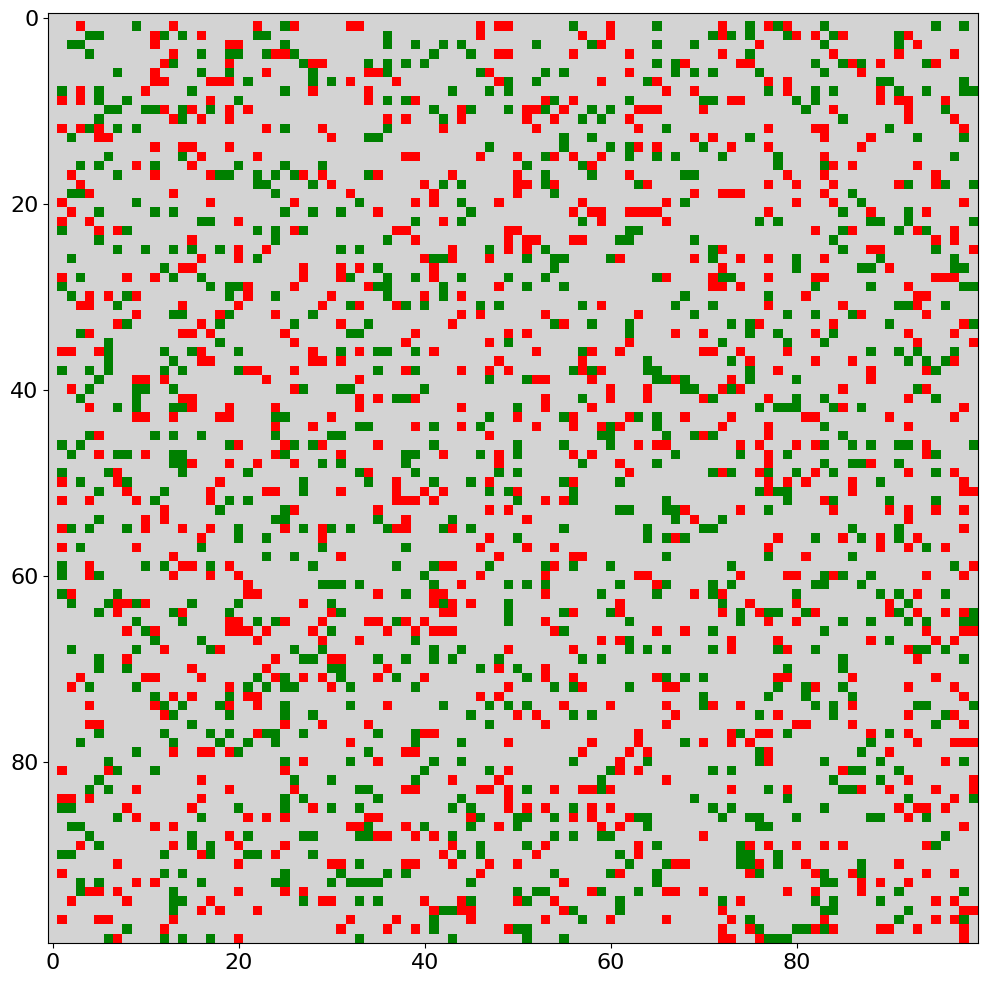

In [ ]:
#VISUALIZE SIMULATION

population = np.zeros((100, 100))

for i in range (1, 100):

  for j in range(1, 100):

    if area[i][j] == None:
      pass

    elif area[i][j].group == "Susceptible":

      population[i][j] = 1.0

    else:

      population[i][j] = 2.0



#Colourize simulation
colormap = colors.ListedColormap(['lightgrey', "green", "red"])

pyplot.figure(figsize = (12, 25))

pyplot.xticks(fontsize = 16)
pyplot.yticks(fontsize = 16)


pyplot.imshow(X = population, cmap = colormap)


In [ ]:
#CREATE CELL CLASS THAT ALLOWS GENERATION AND ANIMATION OF CELLS
class Cell:
    def __init__(self, x, y, group):
        self.x = x
        self.y = y
        self.group = group


#EPIDEMIC MODEL THAT BUILDS THE ENTIRE SIMULATION
class EpidemicModel:
    def __init__(self, size=100, normal = 300, infected = 4, ss_prob = 0.1):

        self.size = size #SIZE OF THE GRID
        self.area = [[None for _ in range(size)] for _ in range(size)]
        self.population = np.zeros((size, size))
        self.normal = [Cell(random.randint(0, size-1), random.randint(0, size-1), "Susceptible") for _ in range(300)] #UNINFECTED CELLS
        self.infected = [Cell(random.randint(0, size-1), random.randint(0, size-1), "Infected") for _ in range(4)] #INFECTED CELLS
        self.ss = [] #REPRESENTS SUPER-SPREADERS
        self.newly_infected = [] #LIST FOR NEWLEY INFECTED CELLS
        self.dead = [] #LIST THAT STORES INATIMATE DEAD CELLS
        self.ss_prob = ss_prob #PROBABILITY THAT AN INFECTED CELLS BECOMES A SUPER SPREADER

        for cell in self.infected[:]:

          if random.random() < ss_prob:
            cell.group = "Super-Spreader"
            self.ss.append(cell)
            self.infected.remove(cell)

          else:
            cell.group = "Infected"

        for cell in self.normal + self.infected + self.ss:
            self.area[cell.x][cell.y] = cell

        self.cmap = colors.ListedColormap(['lightgrey', 'green', 'red', 'purple', 'black'])
        self.img = None


    #FUNCTION THAT RETURNS THE TOTAL POPULATION
    def total_population(self):

      return self.normal + self.infected



    #FUNCTION THAT ENABLES CELLS TO MOBILIZE
    def move_cell(self, groupList):

        #SKIP AND PREVENT DEAD CELLS FROM MOBILIZING
        for cell in groupList:
          if cell.group == "Dead":
            continue


          x_dir, y_dir = random.choice([-1, 0, 1]), random.choice([-1, 0, 1])

          new_x = cell.x + x_dir
          new_y = cell.y + y_dir

          #MAKE SURE CELLS STAY WITHIN BOUNDS OF GRID/AREAS
          if 0 <= new_x < self.size and 0 <= new_y < self.size and self.area[new_x][new_y] is None:
              self.area[cell.x][cell.y] = None
              cell.x, cell.y = new_x, new_y
              self.area[new_x][new_y] = cell




    def step(self):

        self.move_cell(self.normal)
        self.move_cell(self.infected)
        self.move_cell(self.ss)
        self.infect_cell()
        self.kill_cell()

        self.population.fill(0)

        for i in range(self.size):

            for j in range(self.size):
                cell = self.area[i][j]

                if cell:

                  if cell.group == "Susceptible":
                    self.population[i][j] = 1

                  elif cell.group == "Infected":
                    self.population[i][j] = 2

                  elif cell.group == "Super-Spreader":
                    self.population[i][j] = 3

                  elif cell.group == "Dead":
                    self.population[i][j] = 4

                else:

                  self.population[i][j] = 0





    def infect_cell(self):
        newly_infected = []

        for cell in self.normal:
            infected_neighbors = 0
            ss_neighbors = 0

            # Expand the infection radius by checking a larger neighborhood (e.g., 5x5 instead of 3x3)
            for x_dir in range(-2, 3):  # From -2 to 2, creating a 5x5 neighborhood
                for y_dir in range(-2, 3):

                    if x_dir == 0 and y_dir == 0:
                        continue

                    new_x = cell.x + x_dir
                    new_y = cell.y + y_dir

                    if 0 <= new_x < self.size and 0 <= new_y < self.size:
                        neighbor = self.area[new_x][new_y]

                        if neighbor and neighbor.group == "Infected":
                            infected_neighbors += 1

                        if neighbor and neighbor.group == "Super-Spreader":
                            ss_neighbors += 1

            infection_chance = 0

            # Now infection is more probable when a cell is surrounded by infected neighbors.
            if infected_neighbors > 0:
                # Increase infection chance significantly based on the number of infected neighbors
                infection_chance = min(0.1 * infected_neighbors, 1.0)  # Higher multiplier for infection chance

            if ss_neighbors > 0:
                infection_chance += 0.2 * ss_neighbors

            if random.random() < infection_chance:
                newly_infected.append(cell)

        # Now update the state of newly infected cells and their groups
        for cell in newly_infected:
            if random.random() < self.ss_prob:  # Is this a super-spreader?
                if cell.group != "Super-Spreader":  # Prevent re-assigning a super-spreader to infected
                    cell.group = "Super-Spreader"
                    self.ss.append(cell)
                    if cell in self.infected:
                        self.infected.remove(cell)
            else:
                if cell.group != "Super-Spreader":  # Prevent re-assigning an infected cell to super-spreader
                    cell.group = "Infected"
                    self.infected.append(cell)

            # UPDATE AREA GRID TO CONVERT FROM NORMAL TO INFECTED CELL
            self.area[cell.x][cell.y] = cell

        self.normal = [cell for cell in self.normal if cell not in newly_infected]



    #KILLS INFECTED CELL WHEN RANDOM NUMBER GENERATED IS SMALLER THAN THE PROBABILITY
    def kill_cell(self):


      for cell in self.infected[:]:

        #KILL INFECTED CELL IF RANDOM NUMBER IS LESS THAN PROBABILITY OF 1%
        if random.random() < 0.01:
          self.infected.remove(cell)
          cell.group = "Dead"
          self.dead.append(cell)




    def draw(self, ax, step=0):

        if self.img is None:
            self.img = ax.imshow(self.population, cmap=self.cmap, vmin=0, vmax=4)
            ax.set_aspect('equal')
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_title("Epidemic Movement Simulation")
            #plt.colorbar(self.img, ax=ax, ticks=[0, 1, 2])

        else:
            self.img.set_data(self.population)



        num_normal = len(self.normal)
        num_infected = len(self.infected)
        num_ss = len(self.ss)
        num_dead = len(self.dead)


        ax.set_title(f"Step: {step}\n"
                    f"Susceptible: {num_normal} | "
                    f"Infected: {num_infected} | "
                    f"Super-Spreaders: {num_ss} | "
                    f"Dead: {num_dead}")


        legend_elements = [
          Patch(facecolor='lightgrey', edgecolor='black', label='Empty'),
          Patch(facecolor='green', edgecolor='black', label='Susceptible'),
          Patch(facecolor='red', edgecolor='black', label='Infected'),
          Patch(facecolor='purple', edgecolor='black', label='Super-Spreader'),
          Patch(facecolor='black', edgecolor='black', label='Dead')
      ]

        ax.legend(handles=legend_elements, loc='upper right', fontsize='small', frameon=True)

#ANIMATION CLASS THAT ANIMATES THE ENTIRE SIMULATION AND ALLOWS CELLS TO MOVE
class Animation2D:
    """
    Animates any 2D model with a step() method and a draw() method, using matplotlib
    """

    def __init__(self, model, frames=50, steps_per_frame=1, figsize=(8, 8)):
        self.model = model
        self.frames = frames
        self.steps_per_frame = steps_per_frame
        self.fig, self.ax = plt.subplots(figsize=figsize)



    def animation_step(self, step):
        if step > 0:
            for _ in range(self.steps_per_frame):
                self.model.step()
        self.model.draw(self.ax, step=step * self.steps_per_frame)



    def show(self):
        anim = animation.FuncAnimation(self.fig, self.animation_step, frames=self.frames)
        plt.close()  # prevents duplicate static plot in notebook
        return anim


    def animate(self, interval=None):

        try:
            for i in range(self.frames):
                clear_output(wait=True)
                self.ax.clear()
                self.animation_step(i)
                plt.show()
                if interval:
                    time.sleep(interval)
        except KeyboardInterrupt:
            pass


# TEST AND SHOW BOTH ANIMATION AND SIMULATION
model = EpidemicModel()
animator = Animation2D(model, frames=400)

HTML(animator.show().to_jshtml())

Infected: 1 → Avg. Super-Spreader Contribution: 0.00 → Avg. Peak Rate: 0.14
In 0.00% of trials, super-spreaders contributed >50% to the total infections.
Infected: 2 → Avg. Super-Spreader Contribution: 0.00 → Avg. Peak Rate: 0.14
In 0.00% of trials, super-spreaders contributed >50% to the total infections.
Infected: 3 → Avg. Super-Spreader Contribution: 0.00 → Avg. Peak Rate: 0.13
In 0.00% of trials, super-spreaders contributed >50% to the total infections.
Infected: 4 → Avg. Super-Spreader Contribution: 0.00 → Avg. Peak Rate: 0.11
In 0.00% of trials, super-spreaders contributed >50% to the total infections.
Infected: 10 → Avg. Super-Spreader Contribution: 0.00 → Avg. Peak Rate: 0.13
In 0.00% of trials, super-spreaders contributed >50% to the total infections.
Infected: 20 → Avg. Super-Spreader Contribution: 0.00 → Avg. Peak Rate: 0.12
In 0.00% of trials, super-spreaders contributed >50% to the total infections.
Infected: 50 → Avg. Super-Spreader Contribution: 0.01 → Avg. Peak Rate: 0.

<ipython-input-29-d048af845557>:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


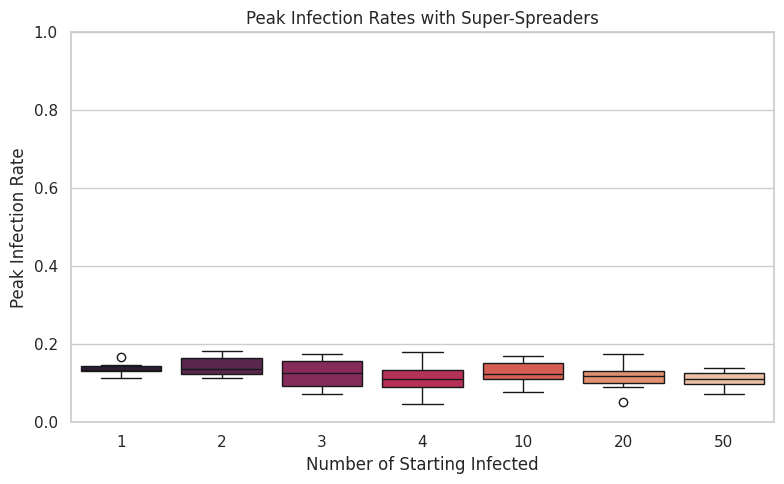

In [ ]:
#RUNS A NUMBER OF SIMULATIONS WITH DIFFERENT NUMBER OF SUPER-SPREADERS
def simulation_testing(size=100, normal=300, infected=4, ss_percent=0.9, frames=400):
    # Initialize model
    virus_model = EpidemicModel(size=size, normal=normal, infected=infected, ss_prob=0.2)

    # SET INITIAL SUPER=SPREADERS
    num_ss = int(ss_percent * infected)
    for i in range(min(num_ss, len(virus_model.infected))):
        virus_model.infected[i].group = "Super-Spreader"

    total_infected = 0
    super_spreader_infected = 0

    #SIMULATE AND DETERMINE THE PEAK INFECTION RATE
    for _ in range(frames):
        virus_model.step()

        # Track total infections and infections by super-spreaders
        current_infected = len([cell for cell in virus_model.infected if cell.group in ("Infected", "Super-Spreader")])
        total_infected = current_infected
        super_spreader_infected = len([cell for cell in virus_model.infected if cell.group == "Super-Spreader"])

    total_pop = normal + infected
    return total_infected, super_spreader_infected, total_pop

def hypothesis_testing_with_plot(trial_runs=10, ss_percent=0.9, infected_numbers=[1, 2, 3, 4, 10, 20, 50], frames=400):
    infection_data = []  # Store infection data for plotting

    # Loop through each test case of different initial infected numbers
    for infected in infected_numbers:

        super_spreader_percentage_list = []
        peak_infection_rate_list = []

        # Run multiple trials for each number of infected agents
        for _ in range(trial_runs):

            total_infected, super_spreader_infected, total_pop = simulation_testing(
                infected=infected, ss_percent=ss_percent, frames=frames)

            # Calculate the percentage of total infections caused by super-spreaders
            super_spreader_percentage = (super_spreader_infected / total_infected) if total_infected > 0 else 0
            super_spreader_percentage_list.append(super_spreader_percentage)

            # Calculate the peak infection rate
            peak = total_infected / total_pop
            peak_infection_rate_list.append(peak)

        avg_super_spreader_percentage = np.mean(super_spreader_percentage_list)
        avg_peak = np.mean(peak_infection_rate_list)
        print(f"Infected: {infected} → Avg. Super-Spreader Contribution: {avg_super_spreader_percentage:.2f} → Avg. Peak Rate: {avg_peak:.2f}")

        # Collect data for each trial for visualization
        for rate in peak_infection_rate_list:
            infection_data.append({"Starting Infected": infected, "Peak Infection Rate": rate})

        # For hypothesis test, track how often super-spreaders contribute to more than 50% of infections
        super_spreader_contribution = np.sum(np.array(super_spreader_percentage_list) > 0.5) / trial_runs
        print(f"In {super_spreader_contribution * 100:.2f}% of trials, super-spreaders contributed >50% to the total infections.")

    # Convert the list of dictionaries into a pandas DataFrame
    df_infection_data = pd.DataFrame(infection_data)

    # Visualization of the boxplot for peak infection rates across all trials
    sns.set(style="whitegrid")
    plt.figure(figsize=(8, 5))
    sns.boxplot(
        x="Starting Infected",
        y="Peak Infection Rate",
        data=df_infection_data,  # Pass the DataFrame here
        palette="rocket"
    )
    plt.title("Peak Infection Rates with Super-Spreaders")
    plt.ylabel("Peak Infection Rate")
    plt.xlabel("Number of Starting Infected")
    plt.ylim(0, 1)
    plt.tight_layout()
    plt.show()

#RUN THE TEST TO CONFIRM HYPOTHESIS
hypothesis_testing_with_plot(
    trial_runs=10,
    ss_percent=0.1,  # You can adjust this to ≤10% as per your hypothesis
    infected_numbers=[1, 2, 3, 4, 10, 20, 50],
    frames=400
)



## **Conclusion:** In conclusion, my hypothesis about super-spreaders was incorrect. However, despite the average peak infection rate being under 0.2, this still suggests that super-spreaders have a somwhat large contribution to infections despite only accounting for under 20% of infections compared to my original hypothesis of 50%

In [ ]:
#CITATIONS AND REFERENCES

#https://www.youtube.com/watch?v=gxAaO2rsdIs


#https://www.supplychaindataanalytics.com/a-simple-agent-based-simulation-run-visualized-using-matplotlib-in-python/

